<span style="color: #f2cf4a; font-family: Babas; font-size: 2em;">Backtesting Custom Portfolios against S&P 500 Index: Return and Risk Analysis</span>

<font face="Rage" size = 4 color="#9d6ac9"> 
In this project, we will create custom portfolios consisting of top 20 components of the S&P 500 Index. We backtest the performance of these portfolios against the index by doing a comprehensive study of return and risk analysis. The portfolios of our interest are as follows:

* Minimum Variance Portfolio
* Equally Weighted Portfolio
* Sector Weighted Portfolio
* Thematic Basket Portfolio
* Graph Based Centrality Weighted Portfolio

    
<ins> Return Analysis </ins> : We compute the last 5-years cumulative returns of these portfolios and that of the index for the analysis. We, then, calculate the annulized return for an investment for the period of 5 years for each of the portfolios. We use these annulized returns to compare the portfios on the basis of the <ins>Sharpe ratio</ins>.
    
<ins> Risk Analysis </ins>: We analyze the <ins>Value at Risk (VaR) and Expected Shortfall (ES)</ins> of our custom portfolios and the index. We use the following three methods to compute the risk metrics.  
* Delta-Normal (Parametric) Method
* Historical-Simulation Method
* Monte Carlo Method
    
These methods basically differ by:
- distributional assumptions for the risk factors (e.g. normal versus other distributions) and
- linear vs full valuation, where linear valuation approximates the exposure to risk factors by a linear model.
   
<font>

In [2]:
# Necessary Libraries

import yfinance as yf
from datetime import datetime, timedelta
import pandas as pd
import scipy.stats as stats

import numpy as np
from scipy.optimize import minimize

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

import networkx as nx
import igraph as ig
import leidenalg as la

import warnings
warnings.filterwarnings('ignore')

<font face="Rage" size = 4 color='#d39aed'>
Here are the top 20 components of the S&P 500 (by market capitalization and performance expectations as of December 2024) along with their sectors:


| **Rank** | **Company**                       | **Ticker** | **Sector**                |
|----------|-----------------------------------|------------|---------------------------|
| 1        | Apple Inc.                        | AAPL       | Information Technology    |
| 2        | Microsoft Corp.                   | MSFT       | Information Technology    |
| 3        | Nvidia Corp.                      | NVDA       | Information Technology    |
| 4        | Amazon.com Inc.                   | AMZN       | Consumer Discretionary    |
| 5        | Meta Platforms, Inc.              | META       | Communication Services    |
| 6        | Tesla, Inc.                       | TSLA       | Consumer Discretionary    |
| 7        | Alphabet Inc. Class C             | GOOGL      | Communication Services    |
| 8        | Broadcom Inc.                     | AVGO       | Information Technology    |
| 9        | Berkshire Hathaway Inc. Class B   | BRK.B      | Financials                |       
| 10       | UnitedHealth Group Incorporated   | UNH        | Health Care               |
| 11       | Johnson & Johnson                 | JNJ        | Health Care               |
| 12       | Exxon Mobil Corp.                 | XOM        | Energy                    |
| 13       | Procter & Gamble Co.              | PG         | Consumer Staples          |
| 14       | Visa Inc. Class A                 | V          | Financials                |
| 15       | Mastercard Inc. Class A           | MA         | Financials                |
| 16       | Chevron Corp.                     | CVX        | Energy                    |
| 17       | The Home Depot Inc.               | HD         | Consumer Discretionary    |
| 18       | Pfizer                            | PFE        | Health Care               |
| 19       | Walmart                           | WMT        | Consumer Staples          |
| 20       | Netflix                           | NFLX       | Communication Services    |

<font>

In [3]:
# List of stock tickers
Stock_list = sorted(['META', 'AAPL', 'AMZN', 'NFLX', 'GOOG', 'TSLA', 'MSFT', 'NVDA', 'AVGO', 'BRK-B', 'UNH', 'JNJ', 'XOM', 'PG', 'MA', 'V', 'HD', 'WMT', 'CVX', 'PFE'])

In [4]:
# Dictionary of stock : sector
Stock_Sectors = {
    'META': 'Communication Services',
    'AAPL': 'Information Technology',
    'AMZN': 'Consumer Discretionary',
    'NFLX': 'Communication Services',
    'GOOG': 'Communication Services',
    'TSLA': 'Consumer Discretionary',
    'MSFT': 'Information Technology',
    'NVDA': 'Information Technology',
    'AVGO': 'Information Technology',
    'BRK-B': 'Financials',
    'UNH': 'Health Care',
    'JNJ': 'Health Care',
    'XOM': 'Energy',
    'PG': 'Consumer Staples',
    'MA': 'Financials',
    'V': 'Financials',
    'HD': 'Consumer Discretionary',
    'WMT': 'Consumer Staples',
    'CVX': 'Energy',
    'PFE': 'Health Care'
}

Stock_Sectors = {key: Stock_Sectors[key] for key in sorted(Stock_Sectors)}

In [5]:
# Goal is to analyze the 5 year cumulative returns.

end_date = datetime.today()
years = 5
start_date = end_date - timedelta(days = years * 365)

In [6]:
# Function to load the stock data from yahoo finance

def Load_Stocks_Data(Stock_list, start_date, end_date):
    
    Stocks_data = yf.download(tickers = Stock_list, start = start_date, end = end_date)['Adj Close']
    Stocks_data = Stocks_data.dropna()
    
    #Plot of the stock values
    fig = px.line(Stocks_data)
    fig.show()
    
    return Stocks_data  

[*********************100%%**********************]  20 of 20 completed


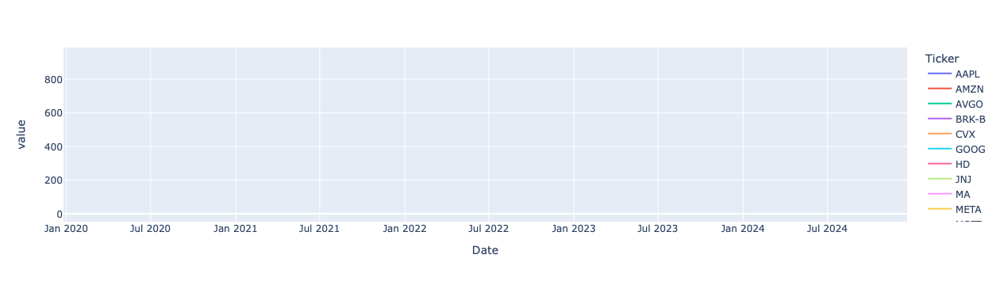

In [7]:
# Loading the stock data

Stocks_data = Load_Stocks_Data(Stock_list, start_date, end_date)

In [8]:
# Calculate the daily returns for each stock

Daily_returns = Stocks_data.pct_change()
Daily_returns.dropna(inplace=True)
Daily_returns.head()

Ticker,AAPL,AMZN,AVGO,BRK-B,CVX,GOOG,HD,JNJ,MA,META,MSFT,NFLX,NVDA,PFE,PG,TSLA,UNH,V,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,
2019-12-27,-0.000380,0.000551,-0.004560,-0.001369,-0.002487,-0.006256,-0.003849,-0.000548,0.005147,0.001492,0.001828,-0.010642,-0.009699,-0.001524,0.006948,-0.001300,0.001082,0.001216,0.000585,-0.003422
2019-12-30,0.005935,-0.012253,-0.009699,-0.001680,-0.003741,-0.011650,-0.012093,-0.003088,-0.010042,-0.017732,-0.008619,-0.017564,-0.019209,-0.010427,-0.012848,-0.036433,-0.007163,-0.008237,-0.001588,-0.005866
2019-12-31,0.007307,0.000514,0.008167,0.003278,0.005507,0.000659,0.004924,0.003923,0.002922,0.004109,0.000698,0.000804,0.012827,0.006939,0.003455,0.008753,0.000442,0.000373,-0.004690,0.004318
2020-01-02,0.022816,0.027151,0.020157,0.008344,0.007634,0.022700,0.005861,0.000685,0.016076,0.022070,0.018516,0.019285,0.019592,-0.001021,-0.011929,0.028518,-0.005035,0.017137,0.000842,0.016050
2020-01-03,-0.009722,-0.012139,-0.025435,-0.009676,-0.003459,-0.004907,-0.003323,-0.011577,-0.009756,-0.005291,-0.012452,-0.011855,-0.016006,-0.005365,-0.006726,0.029633,-0.010120,-0.007953,-0.008828,-0.008039


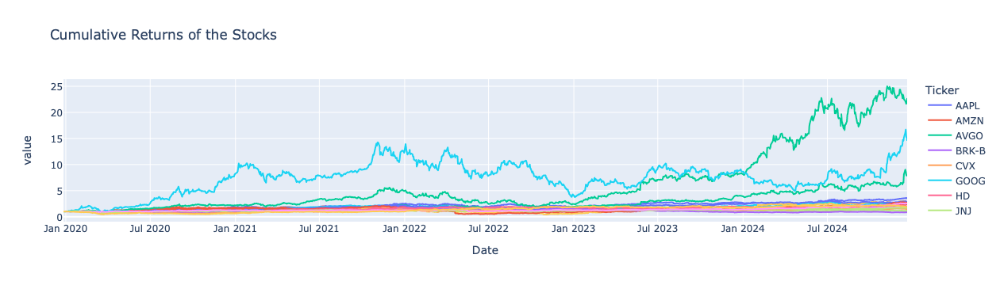

In [9]:
#Calculating the daily cumulative returns
Daily_cuml_returns = (1 + Daily_returns).cumprod()

fig = px.line(Daily_cuml_returns, title= 'Cumulative Returns of the Stocks')
fig.show()

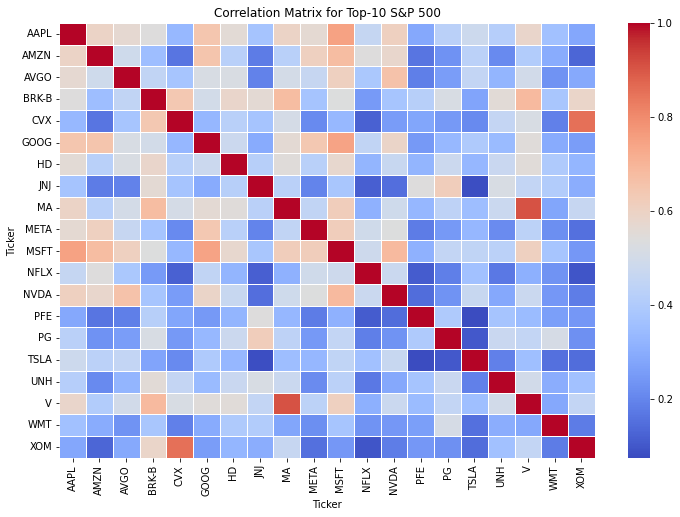

In [10]:
# Computing the variance-covarince and correlation matrices

cov_matrix = Daily_returns.cov()
corr_matrix = Daily_returns.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for Top-10 S&P 500')
plt.show()

In [11]:
#Function to calulate the portfolio variance given the weights and the covariance matrix

def Ptf_Variance(weights, cov_matrix):
    return np.dot(weights.T, np.dot(cov_matrix, weights))

<font face="Rage" size = 6 color='#f2cf4a'> Portfolio I : Minimum Variance Portfolio <font>

<font face="Rage" size = 4 color='#d39aed'> Let us construct a portfolio with the least varinace possible. 
    
<font>

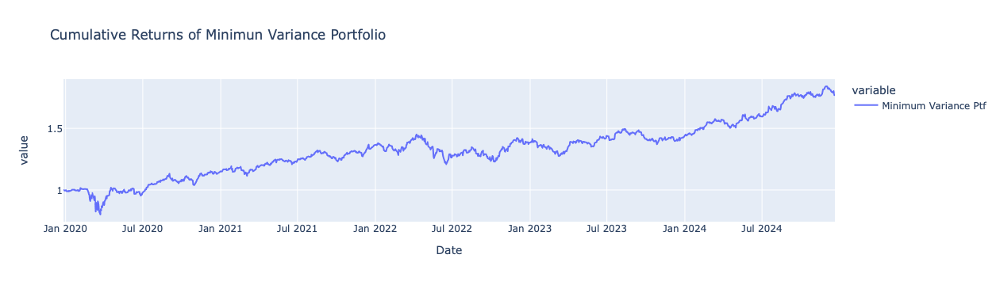

<Figure size 720x432 with 0 Axes>

In [12]:
# Function to calculate the portfolio weights 

def MV_Ptf_Weights(Daily_returns):
    
    Daily_returns_in_perc = Daily_returns * 100
    cov_matrix = Daily_returns_in_perc.cov()
    
    constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1})
    bounds = [(0, 1) for _ in range(len(Stock_list))]
    initial_weights = np.ones(len(Stock_list)) / len(Stock_list)
    
    # We minimize the portfolio variance given the variance-covariance matrix for the stocks
    MV_Optimum = minimize(Ptf_Variance, initial_weights, args=(cov_matrix,), method='SLSQP', bounds=bounds, constraints=constraints)
    MV_Weights = MV_Optimum.x

    return MV_Weights

# Computing the weights for the minimum variance portfolio
MV_Weights = MV_Ptf_Weights(Daily_returns)

#Lets maintain a dataframe where we store the weights
Weights_df = pd.DataFrame()
Weights_df['Stock'] = Stock_list
Weights_df.set_index('Stock', inplace=True)
Weights_df['Minimum Variance Ptf'] = MV_Weights

#Lets also maintain a dataframe for the portfolio variance
Ptfs_Risk_dict  = {}

Ptfs_Risk_dict['Minimum Variance Ptf'] = Ptf_Variance(MV_Weights, cov_matrix)

#Returns and Cumulative returns for Minimum Variance Portfolio
MV_ptf_returns = np.dot(Daily_returns, MV_Weights)
MV_ptf_cuml_returns = (1 + MV_ptf_returns).cumprod()

# Creating a dataframe to store portfolios returns
Ptfs_Returns = pd.DataFrame(MV_ptf_returns, index=Daily_returns.index, columns=['Minimum Variance Ptf'])


# Creating a dataframe to store portfolios cumulative returns
Ptfs_Cuml_Returns = pd.DataFrame(MV_ptf_cuml_returns, index=Daily_returns.index, columns=['Minimum Variance Ptf'])


#Lets graphically look at the cumulative returns
plt.figure(figsize=(10, 6))
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Minimun Variance Portfolio')
fig.show()

<font face="Rage" size = 6 color='#f2cf4a'> Portfolio II : Portfolio with Equal Weights <font>
---------------------
    
<font face="Rage" size = 4 color='#d39aed'> Here we create the portfolio by assigning equal weights to all the stocks. <font>

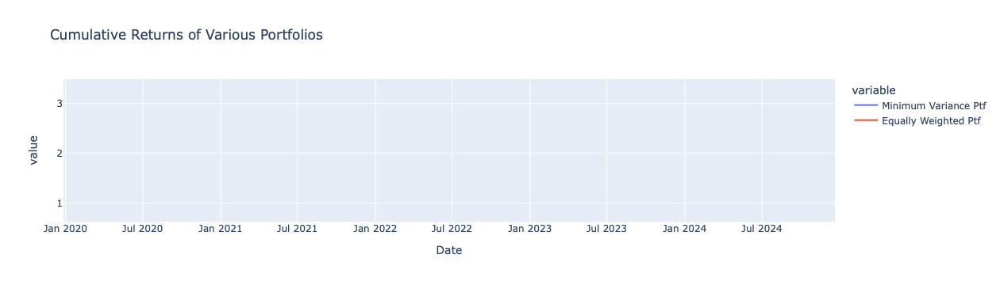

In [13]:
# Weights for the portfolio
equal_weights = np.ones(len(Stock_list)) / len(Stock_list)

# Returns and Cumulative returns for the Portfolio with equal weights for all the stocks
Equally_Weighted_ptf_returns = np.dot(Daily_returns, equal_weights)
Equally_Weighted_ptf_cuml_returns = (1 + Equally_Weighted_ptf_returns).cumprod()

# Appending returns of equally weighted portfolio to dataframe
Ptfs_Returns.loc[:,'Equally Weighted Ptf'] = Equally_Weighted_ptf_returns

# Appending cumulative returns of equally weighted portfolio to dataframe
Ptfs_Cuml_Returns.loc[:,'Equally Weighted Ptf'] = Equally_Weighted_ptf_cuml_returns

#Appending to the Weights dataframe
Weights_df['Equally Weighted Ptf'] = equal_weights

#Appending to the risk to dataframe
Ptfs_Risk_dict['Equally Weighted Ptf'] = Ptf_Variance(equal_weights, cov_matrix)

# Lets graphically compare cumulative returns of this portfolio with minimum variance portfolio
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios')
fig.show()

<font face="Rage" size = 4 color='#d39aed'> We see that Equally Weighted Portfolio performs better that the Minimum Variance Portfolio in terms of the returns.<font>

<font face="Rage" size = 4 color='#d39aed'> Next, we compare the above two portfolios with S&P 500 index. <font>

[*********************100%%**********************]  1 of 1 completed


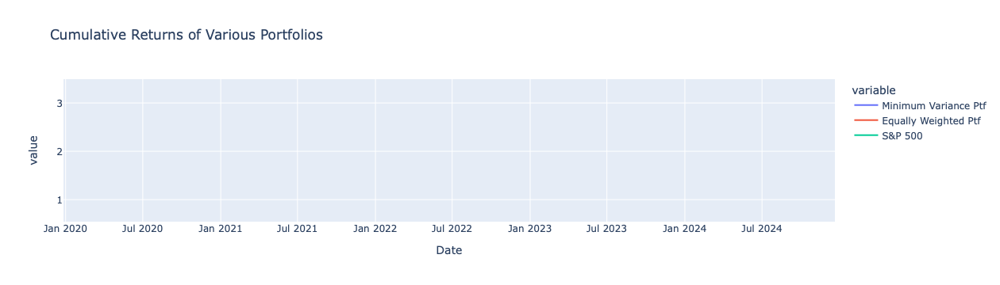

In [14]:
# Returns and Cumulative returns for SPX Index
SnP_500_index = yf.download('^GSPC', start=start_date, end=end_date)['Adj Close']
SnP_500_index_returns = SnP_500_index.pct_change().dropna()
SnP_500_index_cuml_returns = (1 + SnP_500_index_returns).cumprod()

# Appending SPX Index's returns to dataframe
Ptfs_Returns.loc[:,'S&P 500'] = SnP_500_index_returns

# Appending SPX Index's cumulative returns to dataframe
Ptfs_Cuml_Returns.loc[:,'S&P 500'] = SnP_500_index_cuml_returns

# Lets graphically compare the two portfolios with the SPX Index
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios')
fig.show()

<font face="Rage" size = 4 color='#d39aed'> We see that the Equally Weighted Portfolio performs better than both the Minimum Variance portfolio and the SPX Index <font>

<font face="Rage" size = 6 color='#f2cf4a'> Portfolio III: Risk Parity Portfolio <font>

<font face="Rage" size = 4 color='#d39aed'> We now construct a portfolio such that the each component of the portfolio contributes equally to the portfolio risk. Here, a component of the weight corresponding to a stock in the portfolio is inversly proportional to the standard deviation of the stock's returns. <font>

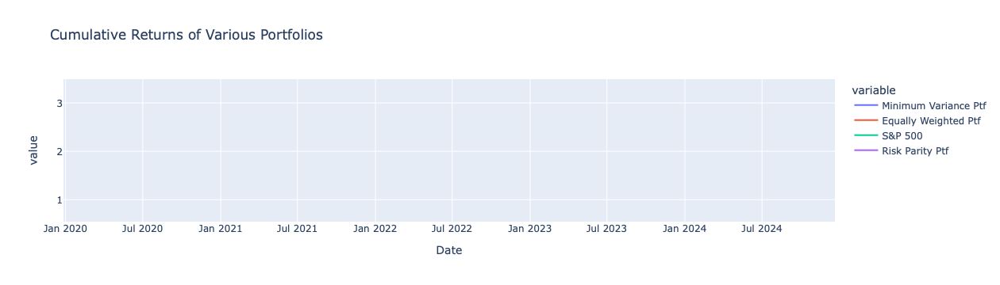

In [15]:
#Risk Parity Portfolio

#Weights for the Risk Parity Portfolio
Stocks_vol = Daily_returns.std()
RPP_weights = 1 / Stocks_vol
RPP_weights /= RPP_weights.sum() 


# Returns for the Risk Parity Portfolio
RP_ptf_returns = np.dot(Daily_returns, RPP_weights)

# Cumulative returns for the Risk Parity Portfolio
RP_ptf_cuml_returns = (1 + RP_ptf_returns).cumprod()

#Appending to the dataframe
Ptfs_Returns.loc[:,'Risk Parity Ptf'] = RP_ptf_returns
Ptfs_Cuml_Returns.loc[:,'Risk Parity Ptf'] = RP_ptf_cuml_returns

#Appending to the Weights dataframe
Weights_df['Risk Parity Ptf'] = RPP_weights

#Appending to the risk to dataframe
Ptfs_Risk_dict['Risk Parity Ptf'] = Ptf_Variance(RPP_weights, cov_matrix)

# Lets compare this portfolio performs with the other portfolios 
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios')
fig.show()

<font face="Rage" size = 4 color='#d39aed'> We see that the Risk Parity Portfolio performs better than the SPX Index and Minimum Variance Portfolio but yields lesser returns compared to Equally Weighted Portfolio. <font>

<font face="Rage" size = 6 color='#f2cf4a'> Portfolio IV : Sector Weighted Portfolio <font>
----------------------------------------

<font face="Rage" size = 4 color='#d39aed'> Next, we construct a portfolio where we assign weights based on the sector of each stock. I have choosen the following weights based on the performance of the sectors. <font>

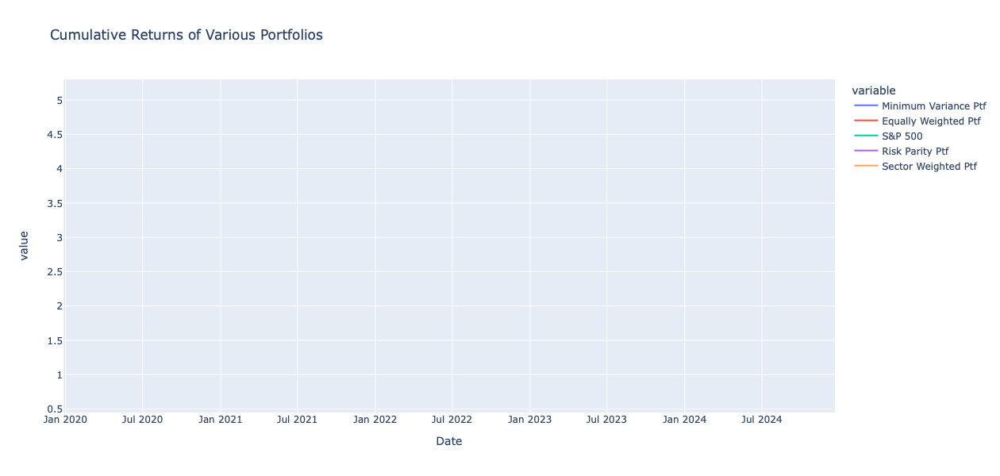

In [16]:
#Defininf weights to each sector

Sector_weights = { 
    'Information Technology': 0.40, 
    'Consumer Discretionary': 0.10, 
    'Communication Services': 0.30, 
    'Financials': 0.05,
    'Health Care': 0.05, 
    'Energy': 0.05,
    'Consumer Staples' : 0.05
    }

# Assign sector weights to each stock
Sectorial_weights = pd.Series({stock: Sector_weights[Stock_Sectors[stock]] for stock in Stock_Sectors})
Sectorial_weights /= Sectorial_weights.sum()

# Returns of Sector Weighted Portfolio
Sectorial_ptf_returns = np.dot(Daily_returns, Sectorial_weights)

# Cumulative returns of Sector Weighted Portfolio
Sectorial_ptf_cuml_returns = (1 + Sectorial_ptf_returns).cumprod()

#Appending to the Weights dataframe
Weights_df['Sector Weighted Ptf'] = Sectorial_weights

#Appending to the risk to dataframe
Ptfs_Risk_dict['Sector Weighted Ptf'] = Ptf_Variance(Sectorial_weights, cov_matrix)

#Appending returns to the dataframe
Ptfs_Returns.loc[:,'Sector Weighted Ptf'] = Sectorial_ptf_returns
Ptfs_Cuml_Returns.loc[:,'Sector Weighted Ptf'] =Sectorial_ptf_cuml_returns


# Lets compare with other portfolios
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios', width=1200, height=600)
fig.show()

<font face="Rage" size = 4 color='#d39aed'> Sector Weighted portfolio performs better than the earlier 4 portfolios. <font>

<font face="Rage" size = 6 color='#f2cf4a'> Portfolio V : Thematic Basket Portfolio <font>
-------------------------------

<font face="Rage" size = 4 color='#d39aed'> Let's create a portfolio with themes such as Tech or Communication Services stocks and see its performance. <font>

<font face="Rage" size = 4 color='#d39aed'> IT Stocks: AAPL, AVGO, NVDA, MSFT <font>

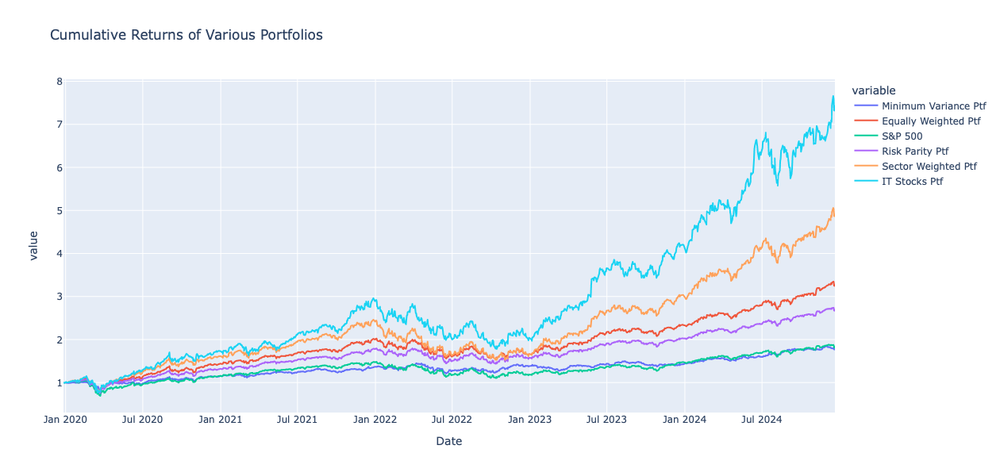

<Figure size 720x432 with 0 Axes>

In [17]:
# Collect the IT stocks from top 20 stocks
IT_stocks = [stock for stock, sector in Stock_Sectors.items() if sector == "Information Technology"]
IT_returns = Daily_returns[IT_stocks]

IT_weights = pd.Series(1 / len(IT_stocks), index=IT_stocks)

# Returns and cumulative returns for the IT theme portfolio
IT_ptf_returns = np.dot(IT_returns, IT_weights)
IT_ptf_cuml_returns = (1 + IT_ptf_returns).cumprod()

#Appending to the dataframe
Ptfs_Returns.loc[:,'IT Stocks Ptf'] = IT_ptf_returns
Ptfs_Cuml_Returns.loc[:,'IT Stocks Ptf'] = IT_ptf_cuml_returns

IT_weights_for_df = []
l = 0
for k in range(len(Stock_list)):
    if Stock_list[k] in IT_stocks:
        IT_weights_for_df.append(IT_weights[l])
        l += 1
    else:
        IT_weights_for_df.append(0)
        
#Appending to the Weights dataframe
Weights_df['IT Stocks Ptf'] = IT_weights_for_df

#Appending to the risk to dataframe
Ptfs_Risk_dict['IT Stocks Ptf'] = Ptf_Variance(IT_weights, Daily_returns[IT_stocks].cov())


# Comparision plot of cumulative returns
plt.figure(figsize=(10, 6))
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios', width=1200, height=600)
fig.show()

<font face="Rage" size = 4 color='#d39aed'> We see that the IT stocks have performed very well in the past 5 years. Next, let's look at stocks pertaining to 'Communication Services' sector. <font>

<font face="Rage" size = 4 color='#d39aed'> Communication Services : GOOG, META, NFLX <font>

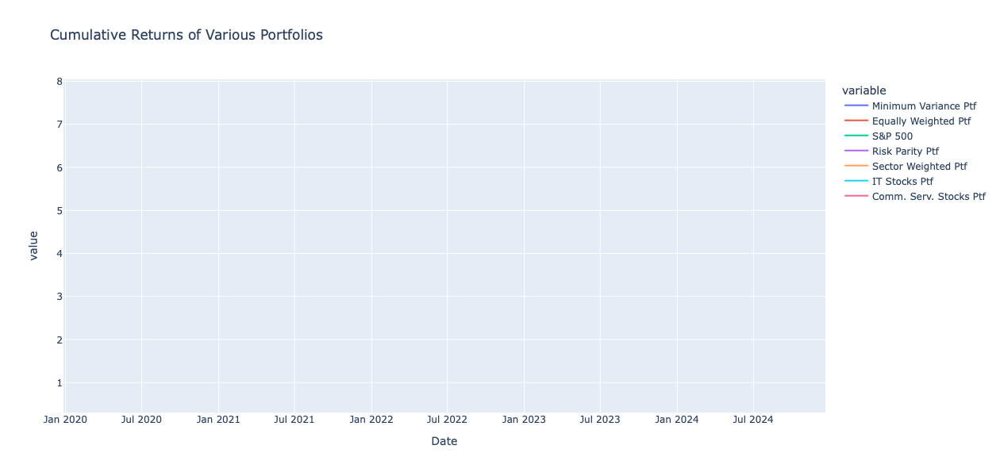

<Figure size 720x432 with 0 Axes>

In [18]:
# Collect the "Communication Services" stocks from top 20 stocks

CommServ_stocks = [stock for stock, sector in Stock_Sectors.items() if sector == "Communication Services"]
CommServ_returns = Daily_returns[CommServ_stocks]

CommServ_weights = pd.Series(1 / len(CommServ_stocks), index=CommServ_stocks)

# Returns and cumulative returns for the 'Communication Services' theme portfolio
CommServ_ptf_returns = np.dot(CommServ_returns, CommServ_weights)
CommServ_ptf_cuml_returns = (1 + CommServ_ptf_returns).cumprod()

#Appending to the dataframe
Ptfs_Returns.loc[:,'Comm. Serv. Stocks Ptf'] = CommServ_ptf_returns
Ptfs_Cuml_Returns.loc[:,'Comm. Serv. Stocks Ptf'] = CommServ_ptf_cuml_returns

CommServ_weights_for_df = []
l = 0
for k in range(len(Stock_list)):
    if Stock_list[k] in CommServ_stocks:
        CommServ_weights_for_df.append(CommServ_weights[l])
        l += 1
    else:
        CommServ_weights_for_df.append(0)
        
#Appending to the Weights dataframe
Weights_df['Comm. Serv. Stocks Ptf'] = CommServ_weights_for_df

#Appending to the risk to dataframe
Ptfs_Risk_dict['Comm. Serv. Stocks Ptf'] = Ptf_Variance(CommServ_weights, Daily_returns[CommServ_stocks].cov())

# Plotting of cumulative returns of various portfolios
plt.figure(figsize=(10, 6))
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios', width=1200, height=600)
fig.show()

<font face="Rage" size = 4 color='#d39aed'>
Note that the Communication services themed portfolio outperforms all the earlier portfolios except the IT themed portfolio. 
<font>

<font face="Rage" size = 6 color='#f2cf4a'> Portfolio VI : Graph Based Community Weighted Portfolio <font>


<font face="Rage" size = 4 color='#d39aed'> Let's cluster the portfolios based on their correlations and create a cluster or community weighted portfolio. The motivation is that the performances of certain stocks are often correlated, either because of the general market direction or the cyclicality of the same segments of the market. For this idea, we will use community detection to identify groups of densely connected nodes, so our future portfolio is solid. We will construct a stock network which is a graph consisting of nodes and edges, where nodes are stock prices, edges are correlations, and clustered stock groups are the communities. <font>
    
<ins>Reference </ins>: [Stock Network Analysis](https://www.kaggle.com/code/akiboy96/stock-network-analysis)


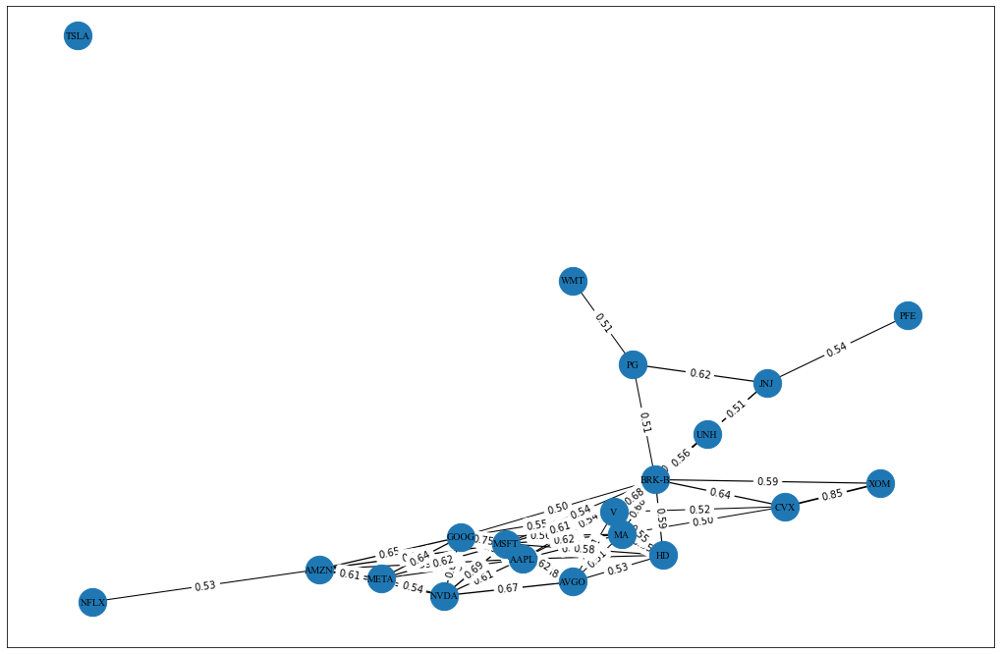

In [19]:
# Computing the log returns for all the stocks
log_returns = np.log(Stocks_data / Stocks_data.shift(1))
log_returns = log_returns.dropna()

# Computing the correlation matrix for the returns
corr_matrix = log_returns.corr()

# Let's create a graph using correlation matrix
Stocks_Graph = nx.Graph()  # Created an empty graph
Stocks_as_nodes = corr_matrix.columns  # Nodes in the graph are the stocks of our interest
Stocks_Graph.add_nodes_from(Stocks_as_nodes)

# Let's add weighted edges to the graph based on the absolute value of correlation between stocks
threshold = 0.50 # Two stocks are connected if and only if their abs(correlation) > threshold and the weight of the edge is abs(correlation)
for i in range(len(Stocks_as_nodes)):
    for j in range(i + 1, len(Stocks_as_nodes)):
        correlation = corr_matrix.iloc[i, j]
        if abs(correlation) > threshold:
            Stocks_Graph.add_edge(Stocks_as_nodes[i], Stocks_as_nodes[j], weight=abs(correlation))

# Let's plot the stocks correlation graph
plt.figure(figsize=(18, 12))

Position = nx.spring_layout(Stocks_Graph)
Edges = Stocks_Graph.edges(data=True)
Edge_labels = {(u, v): f'{d["weight"]:.2f}' for u, v, d in Edges}

nx.draw_networkx_nodes(Stocks_Graph, Position, node_size=800)
nx.draw_networkx_edges(Stocks_Graph, Position, edgelist = Edges, width = [d['weight']*2 for (u, v, d) in Edges])
nx.draw_networkx_labels(Stocks_Graph, Position, font_size = 10, font_family="Times New Roman")
nx.draw_networkx_edge_labels(Stocks_Graph, Position, edge_labels = Edge_labels)

plt.show()

<font face="Rage" size = 4 color='#d39aed'> Now, in order to detect the clusters or communities of closely related stocks, we use igraph library and the Leiden algorithm. <font>

Community 1: BRK-B, CVX, JNJ, PFE, PG, UNH, WMT, XOM 
Community 2: AAPL, AMZN, GOOG, META, MSFT, NFLX, NVDA 
Community 3: AVGO, HD, MA, V 
Community 4: TSLA 


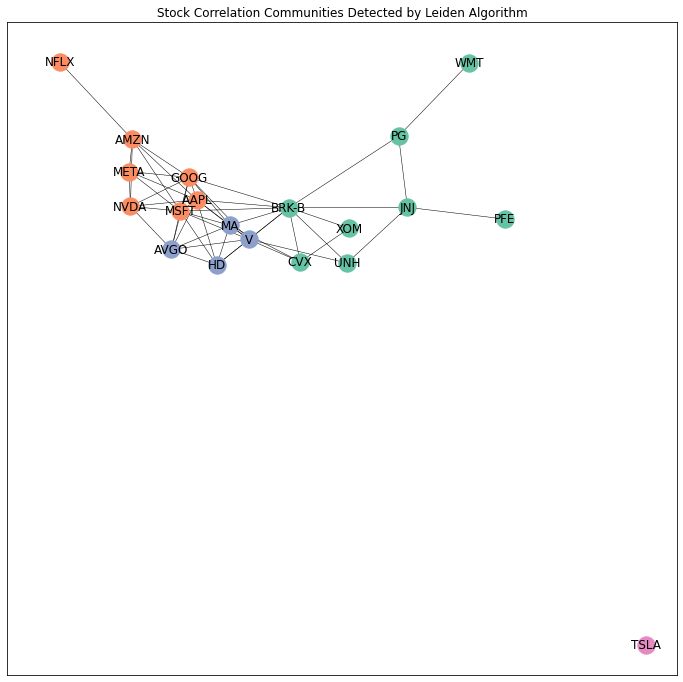

In [20]:
# Let's convert our NetworkX graph to igraph to detect the clusters
Stocks_iGraph = ig.Graph()
Stocks_iGraph.add_vertices(list(Stocks_Graph.nodes))
Stocks_iGraph.add_edges([(u, v) for u, v in Stocks_Graph.edges()])
Stocks_iGraph.es['weight'] = [d['weight'] for u, v, d in Stocks_Graph.edges(data=True)]

# Detect communities using the Leiden algorithm
Clustered_Stocks = la.find_partition(Stocks_iGraph, la.ModularityVertexPartition, weights = Stocks_iGraph.es['weight'])

# Map the detected communities back to NetworkX graph nodes
node_map = {i: node for i, node in enumerate(Stocks_Graph.nodes)}
Communities = {node_map[i]: cluster for i, cluster in enumerate(Clustered_Stocks.membership)}

# Print the communities and the stocks in each community
Communities_dict = {}
for node, community in Communities.items():
    if community not in Communities_dict:
        Communities_dict[community] = []
    Communities_dict[community].append(node)

Communities_dict = {key: Communities_dict[key] for key in sorted(Communities_dict)}

for community, stocks in Communities_dict.items():
    print(f"Community {community + 1}: {', '.join(stocks)} ")
    
# Plot the communities on the graph
colors = plt.get_cmap('Set2')
Total_communities = max(Clustered_Stocks.membership) + 1
Position = nx.spring_layout(Stocks_Graph)

plt.figure(figsize=(12, 12))
for community in range(Total_communities):
    nodes = [node for node, comm in Communities.items() if comm == community]
    nx.draw_networkx_nodes(
        Stocks_Graph, Position, nodelist = nodes,
        node_color = [colors(community)],
        node_size=300, label=f'Community {community + 1}'
    )

nx.draw_networkx_edges(Stocks_Graph, Position, width = 0.5)
nx.draw_networkx_labels(Stocks_Graph, Position)
plt.title("Stock Correlation Communities Detected by Leiden Algorithm")
plt.show()

<font face="Rage" size = 4 color='#d39aed'> <ins>Assigning the weights strategy : </ins> We will assign the weights based on the centrality index of our stocks graph. The centrality index for a node in the graph is a metric for the importance of the node in the graph. One can use degree, betweenness, closeness or eigenvector centralities to value a node. Together these centralities give us a score that help us determine the overall influence of a stock on the network. In our case where we have stocks netwok graph, we will consider the mean of all the centralities for arriving at the weights. And, our strategy is to define weights as inversely proportional to centrality index. This is because the stocks that do not belong to any community tend to perform better than the rest. <font>

<font face="Rage" size = 4 color='#d39aed'> <ins>Calculating the weights : </ins> Suppose $n$ is the total number of stocks and $x$ be the number of ones that have NaN as centrality index. When the centrality index in NaN, that would mean that there is a community formed by that stock alone. If $x = 0$, then the weights would be inversely proportional to centrality index. If $x>0$, then we will assign the weight $\frac{1}{x+1}$ to each of the stock with NaN as centrality index. The remaining part of the weight, that is, $1 - \frac{x}{x+1} = \frac{1}{x+1}$ will be shared by the rest of the stocks proportional to their inverse of centrality index. <font>
    
<ins>Reference</ins>:[This Github repository.](https://github.com/GeetRakala/finance-projects) 

In [21]:
#Defining the centrality index as the mean of the four indices

# Calculate degree, betweenness, closeness, and eigenvector centralities
degree_centrality = Stocks_iGraph.degree()
betweenness_centrality = Stocks_iGraph.betweenness(weights='weight')
closeness_centrality = Stocks_iGraph.closeness()
eigenvector_centrality = Stocks_iGraph.eigenvector_centrality(weights='weight')

centralities = {
    'Degree Centrality': np.array(degree_centrality),
    'Betweenness Centrality': np.array(betweenness_centrality),
    'Closeness Centrality': np.array(closeness_centrality),
    'Eigenvector Centrality': np.array(eigenvector_centrality)
}

# Compute the centrality index as mean of all the centralities
Centrality_Index = np.mean(
    [centralities['Degree Centrality'], centralities['Betweenness Centrality'],
     centralities['Closeness Centrality'], centralities['Eigenvector Centrality']],
    axis=0
)

stock_names = Stocks_iGraph.vs['name']
Centrality_data = pd.DataFrame({
    'Stock': stock_names,
    'Centrality Index': Centrality_Index
})


# Assigning Weights:
# Identify NaN and non-NaN centrality stocks
non_nan_mask = Centrality_data['Centrality Index'].notna()
nan_mask = Centrality_data['Centrality Index'].isna()

x = Centrality_data['Centrality Index'].isna().sum()  # Number of NaN stocks
y = len(Centrality_data) - x  # Number of non-NaN stocks

Centrality_data.loc[nan_mask, 'Weight'] = 1 / (x + 1)

remaining_weight = 1 / (x + 1)

Centrality_data.loc[non_nan_mask, 'Inverse Centrality'] = 1 / Centrality_data.loc[non_nan_mask, 'Centrality Index']

inverse_sum = Centrality_data.loc[non_nan_mask, 'Inverse Centrality'].sum()

Centrality_data.loc[non_nan_mask, 'Weight'] = remaining_weight * Centrality_data.loc[non_nan_mask, 'Inverse Centrality'] / inverse_sum

Centrality_data = Centrality_data[['Stock', 'Centrality Index', 'Inverse Centrality', 'Weight']]

print(Centrality_data)

    Stock  Centrality Index  Inverse Centrality    Weight
0    AAPL         12.147591            0.082321  0.002635
1    AMZN          6.000561            0.166651  0.005334
2    AVGO          2.293415            0.436031  0.013956
3   BRK-B         19.109796            0.052329  0.001675
4     CVX          1.192885            0.838304  0.026832
5    GOOG          6.122970            0.163319  0.005228
6      HD          1.787757            0.559360  0.017904
7     JNJ          5.399954            0.185187  0.005927
8      MA          4.097717            0.244038  0.007811
9    META          1.489384            0.671418  0.021491
10   MSFT          2.910714            0.343558  0.010997
11   NFLX          0.345750            2.892261  0.092575
12   NVDA          1.768301            0.565514  0.018101
13    PFE          0.335492            2.980698  0.095406
14     PG          5.140496            0.194534  0.006227
15   TSLA               NaN                 NaN  0.500000
16    UNH     

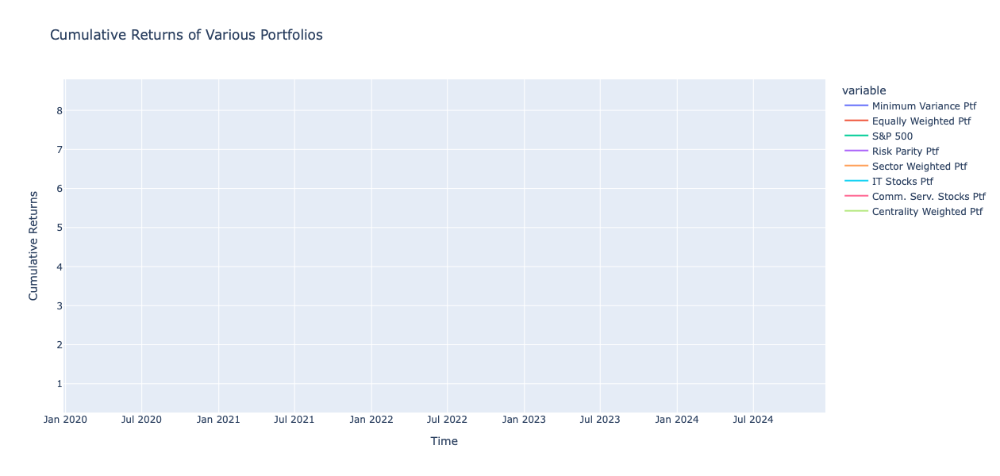

<Figure size 720x432 with 0 Axes>

In [22]:
CW_weights = Centrality_data.set_index('Stock').loc[Daily_returns.columns]['Weight'].values

CW_ptf_returns = np.dot(Daily_returns, CW_weights)
CW_ptf_cuml_returns = (1 + CW_ptf_returns).cumprod()

Ptfs_Returns.loc[:,'Centrality Weighted Ptf'] = CW_ptf_returns
Ptfs_Cuml_Returns.loc[:,'Centrality Weighted Ptf'] = CW_ptf_cuml_returns

#Appending to the Weights dataframe
Weights_df['Centrality Weighted Ptf'] = CW_weights

#Appending to the risk to dataframe
Ptfs_Risk_dict['Centrality Weighted Ptf'] = Ptf_Variance(CW_weights, cov_matrix)

# Plotting of cumulative returns of various portfolios
plt.figure(figsize=(10, 6))
fig = px.line(Ptfs_Cuml_Returns, title = 'Cumulative Returns of Various Portfolios', width=1200, height=600,
              labels={'value': 'Cumulative Returns', 'Date': 'Time'})
fig.show()

<font face="Rage" size = 4 color='#d39aed'> Note that this portfolio has out performed the rest of the portfolios. <font>

<font face="Rage" size = 6 color='#f2cf4a'> Analysis of the Returns of the Portfolios <font>
    
<font face="Rage" size = 4 color='#d39aed'> Now let's analyze all the portfolios by looking at the associated weights, returns and risk. <font>

In [23]:
print(f"\033[4m{'Weights Assigned to Stocks in each of the portfolio:'}\033[0m")
print()
print(Weights_df)
print()

Ptfs_list = ['Minimum Variance Ptf', 'Equally Weighted Ptf', 'Risk Parity Ptf', 
             'Sector Weighted Ptf', 'IT Stocks Ptf', 'Comm. Serv. Stocks Ptf', 'Centrality Weighted Ptf']
Ptfs_5Y_Returns_dict = {'Minimum Variance Ptf': Ptfs_Cuml_Returns['Minimum Variance Ptf'].iloc[-1],
                       'Equally Weighted Ptf': Ptfs_Cuml_Returns['Equally Weighted Ptf'].iloc[-1],
                       'Risk Parity Ptf': Ptfs_Cuml_Returns['Risk Parity Ptf'].iloc[-1],
                       'Sector Weighted Ptf': Ptfs_Cuml_Returns['Sector Weighted Ptf'].iloc[-1],
                       'IT Stocks Ptf': Ptfs_Cuml_Returns['IT Stocks Ptf'].iloc[-1],
                       'Comm. Serv. Stocks Ptf': Ptfs_Cuml_Returns['Comm. Serv. Stocks Ptf'].iloc[-1],
                       'Centrality Weighted Ptf': Ptfs_Cuml_Returns['Centrality Weighted Ptf'].iloc[-1]
                       }
Ptfs_5Y_Returns  = pd.DataFrame(list(Ptfs_5Y_Returns_dict.items()), columns=['Portfolio', 'Return(%)']).set_index('Portfolio')
Ptfs_5Y_Returns['Return(%)'] = ((Ptfs_5Y_Returns['Return(%)'])**(1/5) - 1) * 100
print(f"\033[4m{'Annualized return for an investment over a period of 5 years:'}\033[0m")
print(Ptfs_5Y_Returns)
print()

print(f"\033[4m{'Annualized Risk:'}\033[0m")
Ptfs_Risk  = np.sqrt(pd.DataFrame(list(Ptfs_Risk_dict.items()), columns=['Portfolio', 'Annualized Risk(%)']).set_index('Portfolio') * 365) * 100
print(Ptfs_Risk)
print()


Weights Assigned to Stocks in each of the portfolio:

       Minimum Variance Ptf  Equally Weighted Ptf  Risk Parity Ptf  \
Stock                                                                
AAPL           6.845758e-18                  0.05         0.049043   
AMZN           5.512598e-02                  0.05         0.043196   
AVGO           2.773553e-16                  0.05         0.037190   
BRK-B          9.467395e-02                  0.05         0.071481   
CVX            4.158891e-17                  0.05         0.043670   
GOOG           9.757132e-17                  0.05         0.047974   
HD             0.000000e+00                  0.05         0.053820   
JNJ            3.080478e-01                  0.05         0.079085   
MA             0.000000e+00                  0.05         0.050149   
META           0.000000e+00                  0.05         0.034606   
MSFT           1.613922e-17                  0.05         0.050957   
NFLX           2.901840e-02         

<font face="Rage" size = 6 color='#f2cf4a'> Sharpe Ratio <font>

<font face="Rage" size = 4 color='#d39aed'>
In the following we compute the Sharpe ratio for each of the portfolio using the identity:
$$
    \text{Sharpe Ratio} = \frac{R_p - R_f}{\sigma_p}
$$
where $R_p$ is the expected return of the portfoio, $R_f$ is risk-free-rate of return and $\sigma_p$ is standard deviation of the portfolio return. The risk-free-rate of return is commonly represented by the yield on 10-year U.S. Treasury notes. As of December 19, 2024, this yield was approximately 4.57%.
    
    
Sharpe Ratio plays a significant part in evaluating the performance of a portfolio relative to its risk. It measures how much excess return (over the risk-free rate) an investment generates per unit of risk. This helps investors understand whether the returns of a portfolio are due to smart investment decisions or excessive risk-taking. A higher Sharpe Ratio signifies better risk-adjusted performance.
<font>

In [24]:
Sharpe_Ratio_dict = {}
R_f = 4.57

for ptf in Ptfs_list:
    Sharpe_Ratio_dict[ptf] = (Ptfs_5Y_Returns.loc[ptf, 'Return(%)'] - R_f)/ Ptfs_Risk.loc[ptf, 'Annualized Risk(%)']

Sharpe_Ratios = pd.DataFrame(list(Sharpe_Ratio_dict.items()), columns=['Portfolio', 'Sharpe Ratio']).set_index('Portfolio')
Sharpe_Ratios.loc['S&P 500 Index'] = (((SnP_500_index_cuml_returns.iloc[-1])**(1/5) - 1)*100 - 4.57)/(SnP_500_index_returns.std()* np.sqrt(365) *100)
Sharpe_Ratios = Sharpe_Ratios.sort_values(by='Sharpe Ratio', ascending=True, inplace=False)
print(Sharpe_Ratios)

                         Sharpe Ratio
Portfolio                            
S&P 500 Index                0.322532
Minimum Variance Ptf         0.385299
Comm. Serv. Stocks Ptf       0.538042
Risk Parity Ptf              0.706620
Equally Weighted Ptf         0.824654
Sector Weighted Ptf          0.963880
Centrality Weighted Ptf      0.982962
IT Stocks Ptf                1.097449


<font face="Rage" size = 6 color='#f2cf4a'> Risk Analysis <font>
    
<font face="Rage" size = 4 color='#d39aed'> 
    
We shall calculate the VaR and Expected Shortfall using three methods:
    
    (1) Delta-Normal (Parametric) Method 
    (2) Historical Method
    (3) Monte-Carlo Mathod
<font>

<font face="Rage" size = 6 color='#f2cf4a'> Delta-Normal Method<font>

<font face="Rage" size = 4 color='#d39aed'> 
The delta-normal method assumes that all asset returns are normally distributed. As the portfolio return is a linear combination of normal variables, it is also normally distributed. This method consists of going back in time, e.g. over the last 5 years, and computing variances and correlations for all risk factors. Portfolio risk is then generated by a combination of linear exposures to many factors that are assumed to be normally distributed, and by the forecast of the covariance matrix.
<font>   
   

In [25]:

def Delta_Normal_Risk(Ptf_returns, confidence):
    
    mean_returns = Ptf_returns.mean()
    std_dev = Ptf_returns.std()
    
    # Calculate VaR
    z_score = stats.norm.ppf(confidence/100)
    DN_VaR = mean_returns - z_score * std_dev
    
    
    # Calculate ES
    pdf_z = stats.norm.pdf(z_score)  # PDF at the z-score
    DN_ES = mean_returns - std_dev * (pdf_z / (1 - confidence / 100))
    
    return DN_VaR, DN_ES

DN_RiskMeasure_dict = {}
Conf_list = [95, 97, 99]

for ptf in Ptfs_list: 
    Risk_lst = []
    for conf in Conf_list:
        VaR, Es = Delta_Normal_Risk(Ptfs_Returns[ptf], conf)
        Risk_lst.extend([VaR, Es])
    DN_RiskMeasure_dict[ptf] = Risk_lst
    
    
# Convert the dictionary to a DataFrame
DN_RiskMeasure = pd.DataFrame.from_dict(DN_RiskMeasure_dict, orient='index')

# Set column names
DN_RiskMeasure.columns = ['VaR(95%)', 'ES(95%)', 'VaR(97%)', 'ES(95%)', 'VaR(99%)', 'ES(99%)']

Risk_lst = []
for conf in Conf_list:
    VaR, Es = Delta_Normal_Risk(SnP_500_index_returns, conf)
    Risk_lst.extend([VaR, Es])
DN_RiskMeasure.loc['S&P 500 Index'] = Risk_lst

print()
print(f"\033[4m{'Parametric (Daily) Value-at-Risk and Expected-Shortfall for an investment of 1 million in the Portfolios'}\033[0m")
DN_RiskMeasure*1_000_000


Parametric (Daily) Value-at-Risk and Expected-Shortfall for an investment of 1 million in the Portfolios


,VaR(95%),ES(95%),VaR(97%),ES(95%),VaR(99%),ES(99%)
Minimum Variance Ptf,-16349.968493,-20632.587378,-18768.106149,-22737.232724,-23334.570647,-26807.595727
Equally Weighted Ptf,-22083.432208,-27958.551390,-25400.759131,-30845.813269,-31665.272478,-36429.748800
Risk Parity Ptf,-20191.105400,-25541.497552,-23212.150485,-28170.888177,-28917.158676,-33256.103288
Sector Weighted Ptf,-27946.203803,-35408.551951,-32159.743588,-39075.839825,-40116.685079,-46168.337811
IT Stocks Ptf,-33298.401082,-42221.889207,-38336.958851,-46607.238046,-47851.882504,-55088.458743
Comm. Serv. Stocks Ptf,-33986.619764,-42917.340485,-39029.261345,-47306.243703,-48551.896960,-55794.338532
Centrality Weighted Ptf,-38460.590420,-48723.198156,-44255.268601,-53766.642412,-55198.066723,-63520.613047
S&P 500 Index,-21540.233473,-27157.804864,-24712.138627,-29918.497749,-30702.034299,-35257.650116


<font face="Rage" size = 6 color='#f2cf4a'> Historical Method<font>

<font face="Rage" size = 4 color='#d39aed'>    
This method consists of going back in time, e.g. over the last 5 years, and applying current weights to a time-series of historical asset returns. This return does not represent an actual portfolio but rather reconstructs the history of a hypothetical portfolio using the current position. Of course, if asset returns are all normally distributed, the risk-measure obtained under the historical-simulation method should be the same as that under the delta-normal method.
<font>   

In [26]:
def Hist_Risk(Ptf_returns, confidence):
    
    N = len(Ptf_returns)
    
    ret_lst = sorted(Ptf_returns)
    
    term = int(N * (1-confidence/100))
    
    Hist_VaR = ret_lst[term]
    
    
    # Calculate ES
    Hist_ES = 0
    for k in range(term+1):
        Hist_ES += ret_lst[k]
        
    Hist_ES = Hist_ES/term
    
    return Hist_VaR, Hist_ES

Hist_RiskMeasure_dict = {}
Conf_list = [95, 97, 99]

for ptf in Ptfs_list: 
    Risk_lst = []
    for conf in Conf_list:
        VaR, Es = Hist_Risk(Ptfs_Returns[ptf], conf)
        Risk_lst.extend([VaR, Es])
    Hist_RiskMeasure_dict[ptf] = Risk_lst
    
    
# Convert the dictionary to a DataFrame
Hist_RiskMeasure = pd.DataFrame.from_dict(Hist_RiskMeasure_dict, orient='index')

# Set column names
Hist_RiskMeasure.columns = ['VaR(95%)', 'ES(95%)', 'VaR(97%)', 'ES(95%)', 'VaR(99%)', 'ES(99%)']

Risk_lst = []
for conf in Conf_list:
    VaR, Es = Hist_Risk(SnP_500_index_returns, conf)
    Risk_lst.extend([VaR, Es])
Hist_RiskMeasure.loc['S&P 500 Index'] = Risk_lst

print()
print(f"\033[4m{'Historical (Daily) Value-at-Risk and Expected-Shortfall for an investment of 1 million in the Portfolios'}\033[0m")
Hist_RiskMeasure*1_000_000


Historical (Daily) Value-at-Risk and Expected-Shortfall for an investment of 1 million in the Portfolios


,VaR(95%),ES(95%),VaR(97%),ES(95%),VaR(99%),ES(99%)
Minimum Variance Ptf,-13573.932216,-23759.948282,-17365.843564,-29214.054069,-27529.050018,-46423.806313
Equally Weighted Ptf,-19448.370819,-34321.531499,-27322.769057,-42265.657133,-41190.790405,-62963.969902
Risk Parity Ptf,-16850.758192,-31210.033493,-24129.706429,-38750.721446,-38571.688629,-59219.853424
Sector Weighted Ptf,-27620.745721,-42040.918898,-34391.040133,-49722.039117,-47150.968550,-70700.321111
IT Stocks Ptf,-32794.103439,-47794.367716,-39158.627538,-56434.661013,-52939.469941,-79137.136825
Comm. Serv. Stocks Ptf,-33070.629111,-50490.029070,-39537.019335,-60071.457288,-55157.473490,-92175.328553
Centrality Weighted Ptf,-36315.661955,-55805.137527,-47359.375053,-66040.927399,-60832.350288,-92352.234761
S&P 500 Index,-18914.821868,-32900.144908,-25001.984857,-40514.238544,-36284.507106,-61743.016265


<font face="Rage" size = 6 color='#f2cf4a'> Monte-Carlo Method<font>

<font face="Rage" size = 4 color='#d39aed'>
Monte Carlo simulations proceed in two steps.
First, the risk manager specifies a stochastic process for financial variables as well as process parameters; the choice of distributions and parameters such as risk and correlations can be derived from historical data.
Second, fictitious price paths are simulated for all variables of interest. At each horizon considered, which can go from one day to many months ahead, the portfolio is marked-to-market using full valuation. Each of these pseudo realizations is then used to compile a distribution of returns, from which a risk figure can be measured.
<font>


In [27]:
def MC_Risk(Daily_returns, weights, confidence, num_simulations):
    # Calculate mean, std deviation, and covariance matrix of daily returns
    mean_returns = Daily_returns.mean()
    std_dev = Daily_returns.std()
    covar_mat = Daily_returns.cov()
    
    num_stocks = Daily_returns.shape[1]
    
    # Perform Cholesky decomposition
    L = np.linalg.cholesky(covar_mat)
    
    # Simulate random variables for portfolio returns
    z_values = np.random.randn(num_simulations, num_stocks)
    resulting_simulations = np.dot(z_values, L.T) + mean_returns.values
    
    # Ensure weights is a numpy array
    weights = weights.values if isinstance(weights, pd.Series) else weights
    
    # Portfolio returns using the simulated returns and weights
    port_rets = np.sum(resulting_simulations * weights, axis=1)
    
    # Calculate Monte Carlo VaR
    MC_VaR = np.percentile(port_rets, 100 - confidence)
    
    # Calculate Monte Carlo Expected Shortfall
    losses_exceeding_VaR = port_rets[port_rets <= MC_VaR]
    MC_ES = losses_exceeding_VaR.mean()
    
    return MC_VaR, MC_ES

MC_RiskMeasure_dict = {}
Conf_list = [95, 97, 99]

for ptf in Ptfs_list: 
    Risk_lst = []
    for conf in Conf_list:
        VaR, Es = MC_Risk(Daily_returns, Weights_df[ptf], conf, 10_000)
        Risk_lst.extend([VaR, Es])
    MC_RiskMeasure_dict[ptf] = Risk_lst
    
    
# Convert the dictionary to a DataFrame
MC_RiskMeasure = pd.DataFrame.from_dict(MC_RiskMeasure_dict, orient='index')

# Set column names
MC_RiskMeasure.columns = ['VaR(95%)', 'ES(95%)', 'VaR(97%)', 'ES(95%)', 'VaR(99%)', 'ES(99%)']


print()
print(f"\033[4m{'Monte-Carlo (Daily) Value-at-Risk and Expected-Shortfall for an investment of 1 million in the Portfolios'}\033[0m")
MC_RiskMeasure*1_000_000


Monte-Carlo (Daily) Value-at-Risk and Expected-Shortfall for an investment of 1 million in the Portfolios


,VaR(95%),ES(95%),VaR(97%),ES(95%),VaR(99%),ES(99%)
Minimum Variance Ptf,-16531.796992,-20963.777744,-18729.345829,-22697.566082,-22694.535032,-25862.734115
Equally Weighted Ptf,-22232.849195,-27843.491947,-25260.970521,-30847.989143,-31908.736542,-37319.330504
Risk Parity Ptf,-20426.817474,-26319.026320,-23197.427814,-27971.000383,-29057.572916,-32732.016892
Sector Weighted Ptf,-28010.729292,-35800.765081,-31948.158008,-38929.448973,-39535.522756,-44973.894593
IT Stocks Ptf,-33952.376937,-43016.861904,-38687.057855,-47933.510489,-48193.140417,-55447.902163
Comm. Serv. Stocks Ptf,-34358.373316,-42799.106591,-39210.258898,-47071.100001,-48778.332513,-56864.596977
Centrality Weighted Ptf,-38367.169153,-49007.446414,-43563.160092,-52764.452432,-55683.827813,-64173.495541
